# Project B


This notebook will an exploratory data analysis of the chosen dataset.

## Packages Needed

In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import os
import folium

from bokeh.plotting import figure
from bokeh.io import show, output_notebook
from bokeh.models import ColumnDataSource, FactorRange, Legend, HoverTool
from bokeh.palettes import Category20c, Pastel1, Set3
from bokeh.layouts import column, row, widgetbox, gridplot

output_notebook()

Loading BokehJS ...

In [2]:
path = 'C:\\Users\\Miche\\OneDrive - Danmarks Tekniske Universitet\\MMC\\2. Semester\\Social Data\\websites\\data'
os.chdir(path)
os.getcwd()

'C:\\Users\\Miche\\OneDrive - Danmarks Tekniske Universitet\\MMC\\2. Semester\\Social Data\\websites\\data'

## Load Data Business Dataset + Prep

In [3]:
df = pd.read_csv('yelp_reviews_RV_categories.csv', 
                 usecols=['name','address','city','state','latitude', 'longitude','stars',
                         'attributes','categories','hours','text','date','cat_kitchen','cat_type'])
print(df.shape)

(5177322, 14)


In [4]:
df.columns

Index(['name', 'address', 'city', 'state', 'latitude', 'longitude', 'stars',
       'attributes', 'categories', 'hours', 'cat_kitchen', 'cat_type', 'text',
       'date'],
      dtype='object')

No further data prep is needed, since it is already done.

## Testing top categories

In [5]:
print(len(df['cat_kitchen'].value_counts()))

16


In [6]:
df['cat_kitchen'].value_counts()

American (New)            1532422
American (Traditional)    1509972
Italian                    535252
Mexican                    378967
Japanese                   317757
Mediterranean              135315
Latin American             126121
Chinese                    119064
Thai                       116807
Vietnamese                  87961
Indian                      72209
Greek                       62608
Caribbean                   55091
Korean                      55008
Cajun/Creole                51139
New Mexican Cuisine         21629
Name: cat_kitchen, dtype: int64

## Basic statistics

In [7]:
variables = ['name','city','state','categories','cat_kitchen','cat_type']
round(df[variables].describe(),2)

,name,city,state,categories,cat_kitchen,cat_type
count,5177322,5177322,5177322,5177322,5177322,5177322
unique,8688,306,11,9652,16,17
top,Yard House,Austin,MA,"Tapas Bars, Restaurants, American (New), Food,...",American (New),Nightlife
freq,53970,741987,1211590,42825,1532422,997131


In [8]:
variables = ['stars']
round(df[variables].describe(),2)

,stars
count,5177322.00
mean,3.80
std,0.56
min,1.00
25%,3.50
50%,4.00
75%,4.00
max,5.00


C:\Users\Miche\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



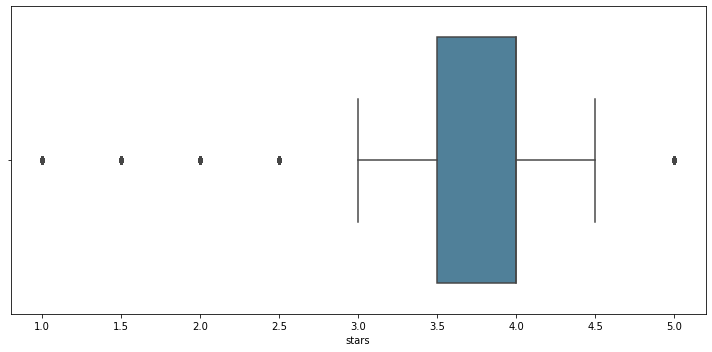

In [9]:
fig = plt.figure(figsize=(10, 5))
sns.boxplot(df['stars'], color='#2b8cbe', saturation=0.5)
plt.tight_layout(h_pad=2)

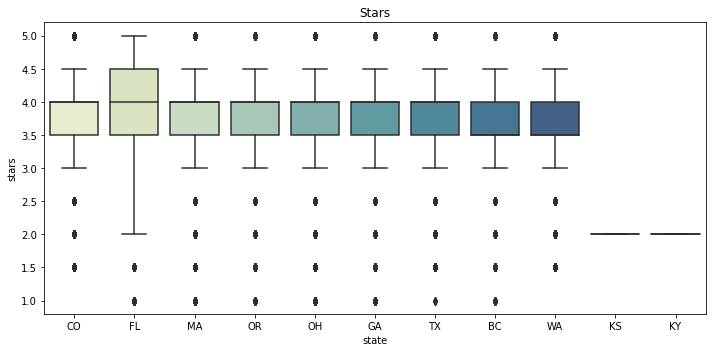

In [10]:
fig = plt.figure(figsize=(10,5))
selected = ['stars']
plt.title('Stars')
sns.boxplot(x='state', y='stars', data=df, palette='YlGnBu', saturation=0.5)
plt.tight_layout(h_pad=2)

## More in-depth plots

In [19]:
group_state = df.groupby(['state','cat_kitchen']).size().reset_index(name='Counts').sort_values(by='Counts',ascending=False)

### Bokeh Plots

In [18]:
#pivot dataframe
df_pivot = group_state.pivot_table(values = 'Counts', index='state', columns='cat_kitchen')
source = ColumnDataSource(df_pivot)

In [20]:
#define bokeh figure
p = figure(x_range = FactorRange(factors=df_pivot.index.to_list()), x_axis_label = 'State',
           y_axis_label='Count', title='Lala', plot_width = 1400, plot_height = 800,
          toolbar_location=None, tools="") 

In [24]:
bar ={} # to store vbars
items = []
### here we will do a for loop:
for indx, i, color in zip(range(len(df_pivot.columns.to_list())), df_pivot.columns.to_list(), Category20c[13]):
    bar[i] = p.vbar(x='state',  top=i, source=source,
                    muted_alpha=0.2, muted = False,
                    color=color, muted_color = color,
                   width=0.5)
    items.append((i, [bar[i]]))

In [25]:
#add legend
legend = Legend(items=items)
p.add_layout(legend,'left')

In [26]:
#Show plot
p.xaxis.major_label_orientation = "vertical"
p.legend.click_policy="mute"
show(p)

## Plots for the Overview page

### General plots

In [27]:
restaurants = df.drop_duplicates(subset='name')
restaurants.shape

(8688, 14)

Map over the different states, where we have restaurants

In [61]:
map_res = folium.Map(location=[48.1667, -100.1667], zoom_start=2.9)

#for each coordinate, create circlemarker of user percent
for i in range(len(restaurants)):
    lat = restaurants.iloc[i]['latitude']
    long = restaurants.iloc[i]['longitude']
    radius = 1
    
    popup_text = """Name : {}.<br>
                    Kitchen : {}.<br>
                    Type : {}.<br>
                 """
    popup_text = popup_text.format(restaurants.iloc[i]['name'],restaurants.iloc[i]['cat_kitchen'], 
                                   restaurants.iloc[i]['cat_type'])
    
    folium.CircleMarker(location = [lat, long],  fill = False, radius = radius,
                        color = '#3186cc', popup = popup_text).add_to(map_res)
#show the map
map_res

More specific plots

In [28]:
group_state_ = restaurants.groupby(['cat_kitchen']).size().reset_index(name='Counts').sort_values(by='Counts',ascending=False)
group_state_['Type'] = group_state_['cat_kitchen'].astype(str)
df_dict_ = group_state_.to_dict('list')

In [29]:
group_state__ = restaurants.groupby(['cat_type']).size().reset_index(name='Counts').sort_values(by='Counts',ascending=False)
group_state__['Type'] = group_state__['cat_type'].astype(str)
df_dict__ = group_state__.to_dict('list')

In [30]:
group_state = restaurants.groupby(['state']).size().reset_index(name='Counts').sort_values(by='Counts',ascending=False)
group_state['state'] = group_state['state'].astype(str)
df_dict = group_state.to_dict('list')

In [37]:
title = 'Restaurants by state'
xlabel = 'State'
range_x = group_state.state.unique().tolist()

plot1 = figure(x_range=FactorRange(factors=range_x), plot_width=600, plot_height=300,
               x_axis_label=xlabel, toolbar_location=None, title=title)
plot1.vbar(x='state', width=0.7, bottom=0,
           top='Counts', source=df_dict, color='lightblue')

# hover tool
plot1.add_tools(HoverTool(tooltips=[('Count', "@Counts{1}")]))

# axis ticks
plot1.xaxis.major_tick_line_color = None 
plot1.xaxis.minor_tick_line_color = None 
plot1.yaxis.major_tick_line_color = None  
plot1.yaxis.minor_tick_line_color = None  
plot1.title.text_font_size = '13pt'
plot1.title.align = 'center'

show(plot1)

In [38]:
title = 'Restaurants by kitchen'
range_x = group_state_['cat_kitchen'].unique().tolist()
xlabel = 'Kitchen type'

plot2 = figure(x_range=FactorRange(factors=range_x), plot_width=600, plot_height=500,
               x_axis_label=xlabel, toolbar_location=None, title=title)
plot2.vbar(x='Type', width=0.7, bottom=0,
           top='Counts', source=df_dict_, color='lightblue')

# hover tool
plot2.add_tools(HoverTool(tooltips=[('Count', "@Counts")]))

# axis ticks
plot2.xaxis.major_tick_line_color = None 
plot2.xaxis.minor_tick_line_color = None 
plot2.yaxis.major_tick_line_color = None  
plot2.yaxis.minor_tick_line_color = None  
plot2.xaxis.major_label_orientation = "vertical"
plot2.title.text_font_size = '13pt'
plot2.title.align = 'center'

show(plot2)

In [39]:
title = 'Restaurants by Categories'
range_x = group_state__['cat_type'].unique().tolist()
xlabel = 'Categories'

plot3 = figure(x_range=FactorRange(factors=range_x), plot_width=600, plot_height=500,
               x_axis_label=xlabel, toolbar_location=None, title=title)
plot3.vbar(x='Type', width=0.7, bottom=0,
           top='Counts', source=df_dict__, color='lightblue')

# hover tool
plot3.add_tools(HoverTool(tooltips=[('Count', "@Counts")]))

# axis ticks
plot3.xaxis.major_tick_line_color = None 
plot3.xaxis.minor_tick_line_color = None 
plot3.yaxis.major_tick_line_color = None  
plot3.yaxis.minor_tick_line_color = None  
plot3.xaxis.major_label_orientation = "vertical"
plot3.title.text_font_size = '13pt'
plot3.title.align = 'center'

show(plot3)

### Score plots

In [64]:
fig = px.histogram(restaurants, x="stars")
fig.show()

Average stars for states, kitchen, and types

In [104]:
avg_state = restaurants.groupby('state').stars.mean().reset_index()
avg_state_dict = avg_state.to_dict('list')

In [108]:
title = 'Average stars by State'
range_x = restaurants['state'].unique().tolist()
xlabel = 'State'
ylabel = 'Stars'

plot4 = figure(x_range=FactorRange(factors=range_x), plot_width=600, plot_height=500,
               x_axis_label=xlabel,y_axis_label=ylabel ,toolbar_location=None, title=title)
plot4.vbar(x='state', width=0.7, bottom=0,
           top='stars', source=avg_state_dict, color='lightblue')

# hover tool
plot4.add_tools(HoverTool(tooltips=[('Average', "@stars{1}")]))

# axis ticks
plot4.xaxis.major_tick_line_color = None 
plot4.xaxis.minor_tick_line_color = None 
plot4.yaxis.major_tick_line_color = None  
plot4.yaxis.minor_tick_line_color = None  
plot4.xaxis.major_label_orientation = "vertical"
plot4.title.text_font_size = '13pt'
plot4.title.align = 'center'

show(plot4)

In [118]:
avg_kitchen = restaurants.groupby('cat_kitchen').stars.mean().reset_index()
avg_kitchen_dict = avg_kitchen.to_dict('list')

In [123]:
title = 'Average stars by State'
range_x = restaurants['cat_kitchen'].unique().tolist()
xlabel = 'Kitchen'
ylabel = 'Stars'

plot4 = figure(x_range=FactorRange(factors=range_x), plot_width=600, plot_height=500,
               x_axis_label=xlabel,y_axis_label=ylabel ,toolbar_location=None, title=title)
plot4.vbar(x='cat_kitchen', width=0.7, bottom=0,
           top='stars', source=avg_kitchen_dict, color='lightblue')

# hover tool
plot4.add_tools(HoverTool(tooltips=[('Average', "@stars{1}")]))

# axis ticks
plot4.xaxis.major_tick_line_color = None 
plot4.xaxis.minor_tick_line_color = None 
plot4.yaxis.major_tick_line_color = None  
plot4.yaxis.minor_tick_line_color = None  
plot4.xaxis.major_label_orientation = "vertical"
plot4.title.text_font_size = '13pt'
plot4.title.align = 'center'

show(plot4)

In [122]:
avg_type = restaurants.groupby('cat_type').stars.mean().reset_index()
avg_type_dict = avg_type.to_dict('list')

In [124]:
title = 'Average stars by State'
range_x = restaurants['cat_type'].unique().tolist()
xlabel = 'Type'
ylabel = 'Stars'

plot4 = figure(x_range=FactorRange(factors=range_x), plot_width=600, plot_height=500,
               x_axis_label=xlabel,y_axis_label=ylabel ,toolbar_location=None, title=title)
plot4.vbar(x='cat_type', width=0.7, bottom=0,
           top='stars', source=avg_type_dict, color='lightblue')

# hover tool
plot4.add_tools(HoverTool(tooltips=[('Average', "@stars{1}")]))

# axis ticks
plot4.xaxis.major_tick_line_color = None 
plot4.xaxis.minor_tick_line_color = None 
plot4.yaxis.major_tick_line_color = None  
plot4.yaxis.minor_tick_line_color = None  
plot4.xaxis.major_label_orientation = "vertical"
plot4.title.text_font_size = '13pt'
plot4.title.align = 'center'

show(plot4)